In [1]:
%matplotlib inline

In [2]:
import sys
sys.path.insert(0,'..')
import pickle

import visualize
import datasets
import ldle
# Uncomment to reload a library
from importlib import reload 
visualize = reload(visualize)
ldle = reload(ldle)
datasets = reload(datasets)

matplotlib.get_backend() =  module://ipykernel.pylab.backend_inline
matplotlib.get_backend() =  module://ipykernel.pylab.backend_inline


In [3]:
save_dir_root = '../data/ldle1/spherewithanomaly/'

In [4]:
X, labelsMat, ddX = datasets.Datasets().spherewithanomaly()

X.shape =  (10000, 3)


# LDLE

In [5]:
ldle_obj = ldle.LDLE(X=X, eta_min=15, max_iter0=20,
                     vis = visualize.Visualize(save_dir_root),
                     vis_y_options = {'cmap0':'summer', # for the interior
                                      'cmap1':'jet', # for the tear
                                      'labels':labelsMat[:,0]})

Using LDLE_1
A_k, Atilde_k: 0 points processed...
A_k, Atilde_k: 2500 points processed...
A_k, Atilde_k: 5000 points processed...
A_k, Atilde_k: 7500 points processed...
Atilde_k, Atilde_k: all points processed...

Constructing low distortion local views using LDLE...
local_param: 0 points processed...
local_param: 2500 points processed...
local_param: 5000 points processed...
local_param: 7500 points processed...
local_param: all 10000 points processed...
After iter 1, max distortion is 28.594424
After iter 2, max distortion is 24.101408
After iter 3, max distortion is 24.101408
After iter 4, max distortion is 24.101408
After iter 5, max distortion is 24.101408
After iter 6, max distortion is 24.101408
After iter 7, max distortion is 24.101408
After iter 8, max distortion is 24.101408
Max local distortion = 24.10140839560048
###############
Took 51.3 seconds to perform step 1: construct low distoriton local views
###############

Clustering to obtain low distortion intermediate views.

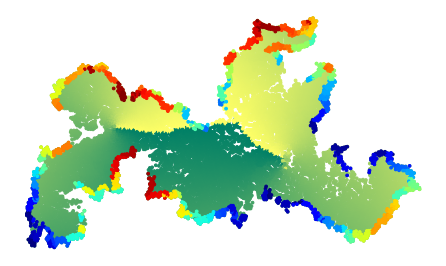

###############
Took 5.2 seconds to compute initial global embedding.
###############

Refining parameters and computing final global embedding...
Using GPA...
Iteration: 0
error: 0.00040694335235066036


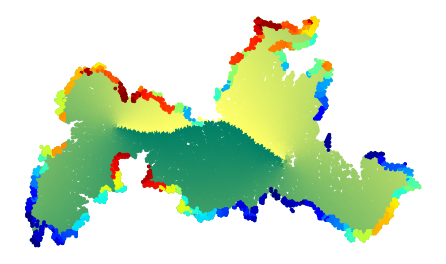

Iteration: 1
error: 0.0004429912684036164
Iteration: 2
error: 0.00045756466393608947
Iteration: 3
error: 0.00047365180837182196
Iteration: 4
error: 0.0004779624275709919
Iteration: 5
error: 0.0004872308411496007


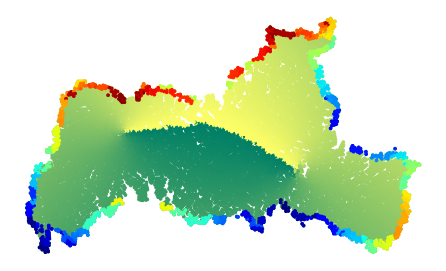

Iteration: 6
error: 0.0004946195119608615
Iteration: 7
error: 0.0005105235503470736
Iteration: 8
error: 0.0005308679882143127
Iteration: 9
error: 0.0005529257334774332
Iteration: 10
error: 0.0005773908747972884


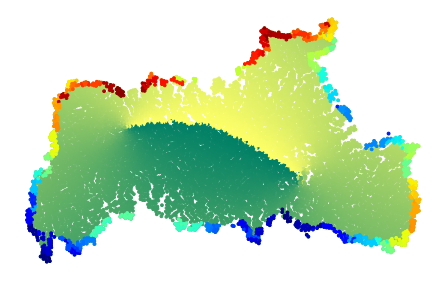

Iteration: 11
error: 0.0005881769148706686
Iteration: 12
error: 0.0006146611982607886
Iteration: 13
error: 0.0006225975252452415
Iteration: 14
error: 0.0006270589433540416
Iteration: 15
error: 0.0006462863723800963


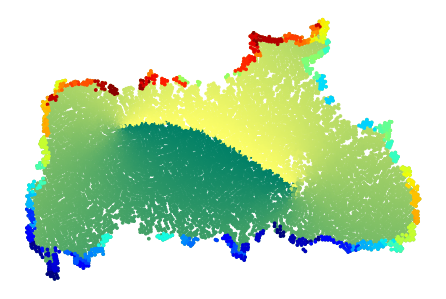

Iteration: 16
error: 0.0006740901811476826
Iteration: 17
error: 0.0006891058742033349
Iteration: 18
error: 0.0007085505586412567
Iteration: 19
error: 0.0007304069535654196


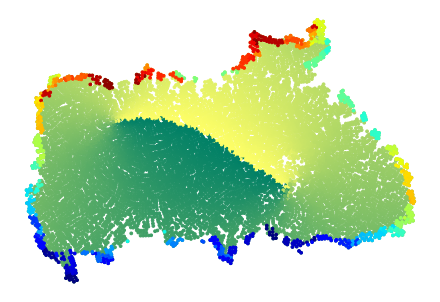

###############
Took 184.9 seconds to refine global embedding.
###############
###############
Took 191.0 seconds to perform step 3: compute global embedding.
###############


In [6]:
ldle_obj.fit()

# Optionally save for further visualizations using Visualization.ipynb

In [7]:
save_path = save_dir_root+'/ldle_obj.dat'
with open(save_path, "wb") as f:
    pickle.dump([X, labelsMat, ldle_obj], f)

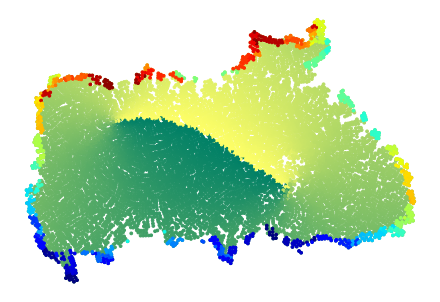

In [8]:
%matplotlib inline
ldle_obj.vis.global_embedding(ldle_obj.y_final, labelsMat[:,0], 'summer',
                             ldle_obj.color_of_pts_on_tear_final, 'jet', 'LDLE0_jet')

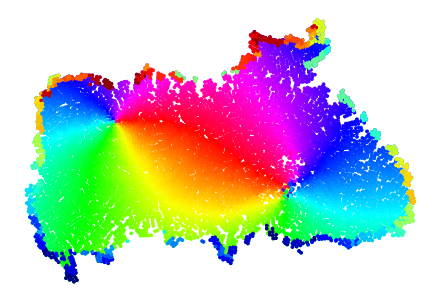

In [18]:
%matplotlib inline
ldle_obj.vis.global_embedding(ldle_obj.y_final, labelsMat[:,0], 'hsv',
                             ldle_obj.color_of_pts_on_tear_final, 'jet', 'LDLE0_hsv_jet')

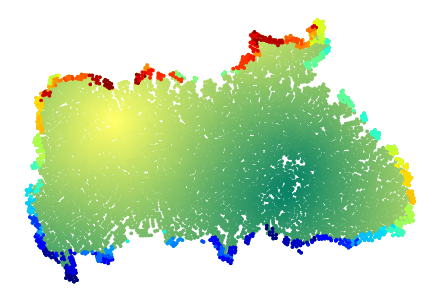

In [9]:
%matplotlib inline
ldle_obj.vis.global_embedding(ldle_obj.y_final, labelsMat[:,1], 'summer',
                             ldle_obj.color_of_pts_on_tear_final, 'jet', 'LDLE1_jet')

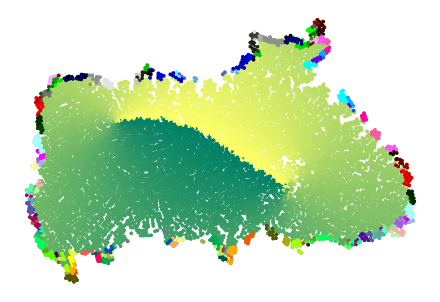

In [10]:
%matplotlib inline
ldle_obj.vis.global_embedding(ldle_obj.y_final, labelsMat[:,0], 'summer',
                             ldle_obj.color_of_pts_on_tear_final, 'colorcube', 'LDLE0_colorcube')

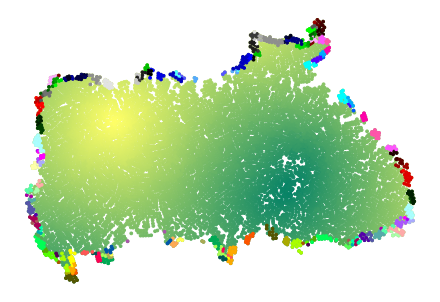

In [11]:
%matplotlib inline
ldle_obj.vis.global_embedding(ldle_obj.y_final, labelsMat[:,1], 'summer',
                             ldle_obj.color_of_pts_on_tear_final, 'colorcube', 'LDLE1_colorcube')

# LTSA

In [12]:
from matplotlib import pyplot as plt
from sklearn.manifold import LocallyLinearEmbedding
import visualize
vis = visualize.Visualize(save_dir_root)

5


/Users/dhkohli/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/eigen/arpack/arpack.py:936: LinAlgWarning: Diagonal number 62 is exactly zero. Singular matrix.
  self.M_lu = lu_factor(M)
<__array_function__ internals>:5: UserWarning: Warning: converting a masked element to nan.
/Users/dhkohli/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


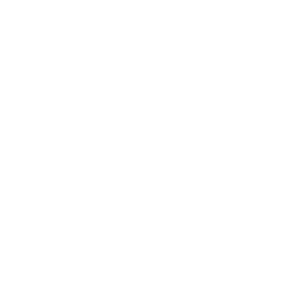

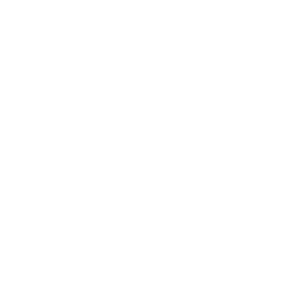

10


/Users/dhkohli/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/eigen/arpack/arpack.py:936: LinAlgWarning: Diagonal number 82 is exactly zero. Singular matrix.
  self.M_lu = lu_factor(M)
<__array_function__ internals>:5: UserWarning: Warning: converting a masked element to nan.
/Users/dhkohli/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


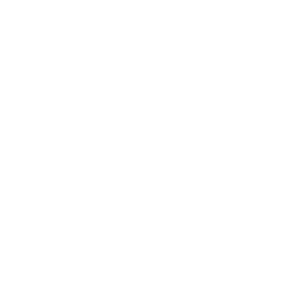

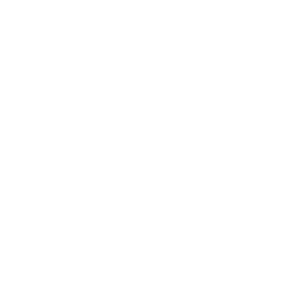

25


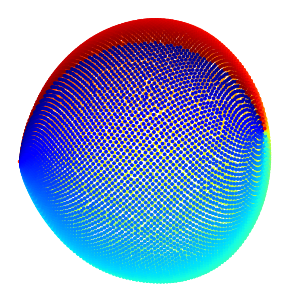

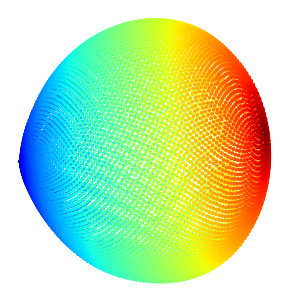

15


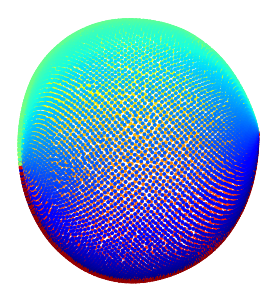

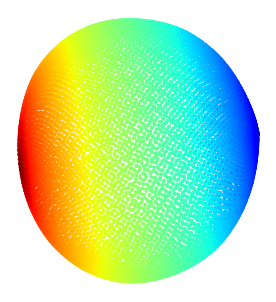

75


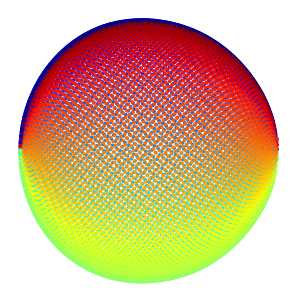

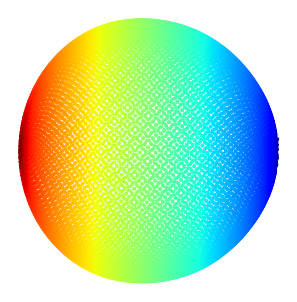

100


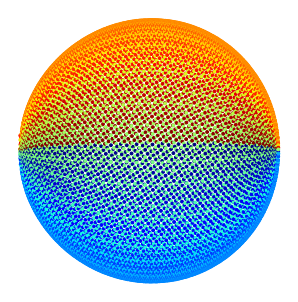

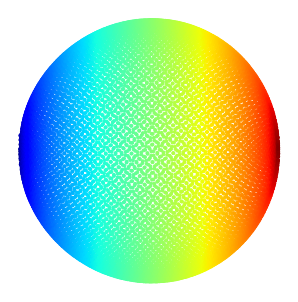

In [13]:
for n_neighbors in [5,10,25,15,75,100]:
    print(n_neighbors)
    ltsa_obj = LocallyLinearEmbedding(method='ltsa', n_neighbors=n_neighbors,
                                      n_components=2, n_jobs=-1, random_state=42)
    y_ltsa = ltsa_obj.fit_transform(X)
    vis.global_embedding(y_ltsa, labelsMat[:,0], 'jet', title='LTSA0_'+str(n_neighbors))
    plt.show()
    vis.global_embedding(y_ltsa, labelsMat[:,1], 'jet', title='LTSA1_'+str(n_neighbors))
    plt.show()

# UMAP

In [14]:
from umap import UMAP
import visualize
vis = visualize.Visualize(save_dir_root)

25 0.01


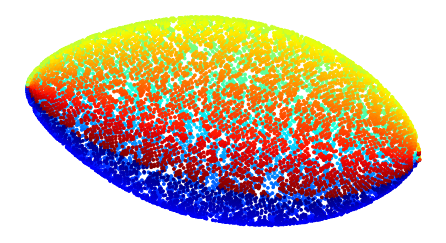

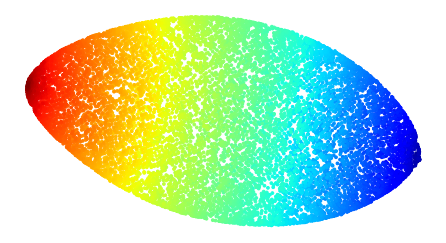

25 0.1


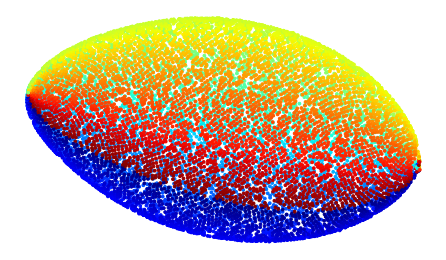

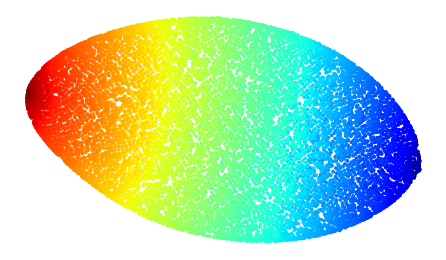

25 0.25


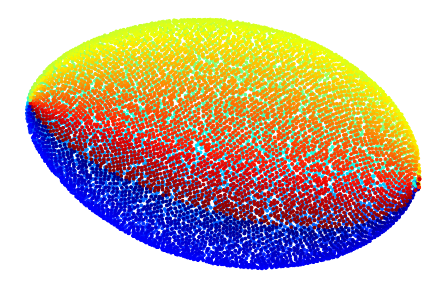

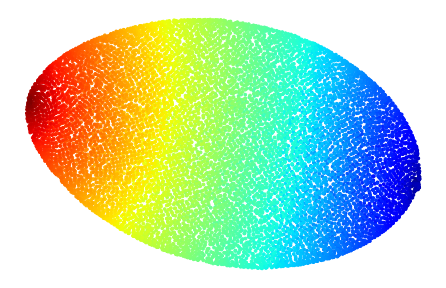

25 0.5


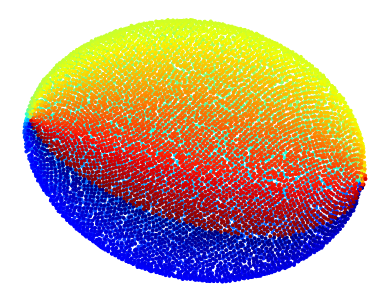

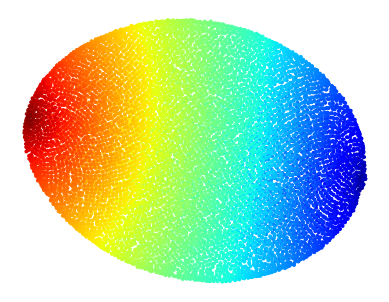

50 0.01


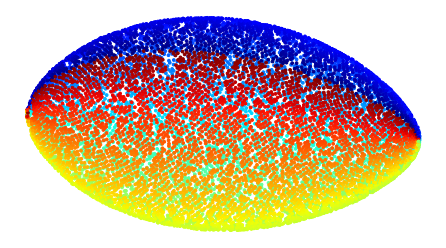

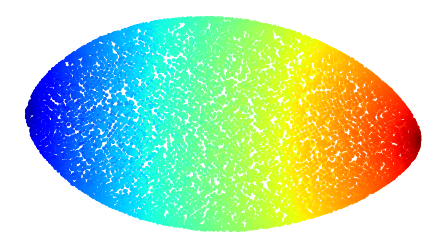

50 0.1


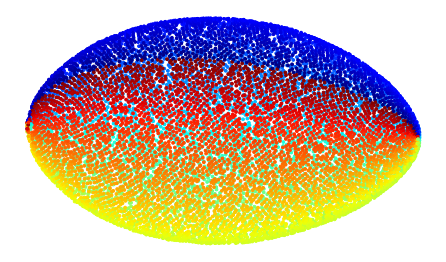

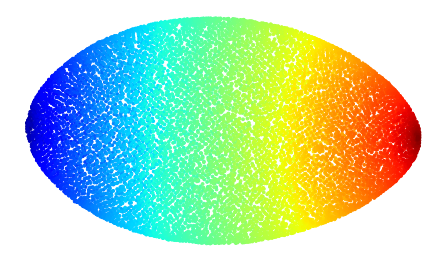

50 0.25


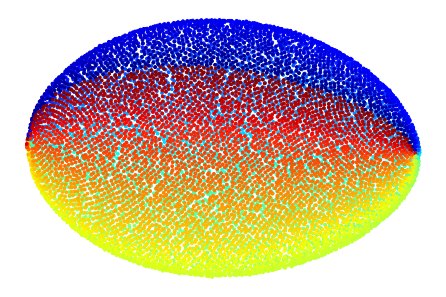

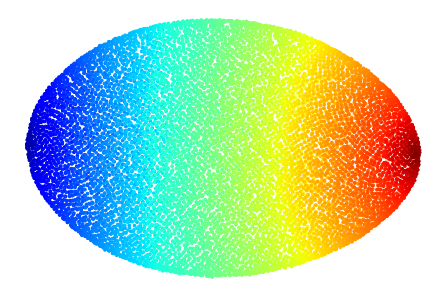

50 0.5


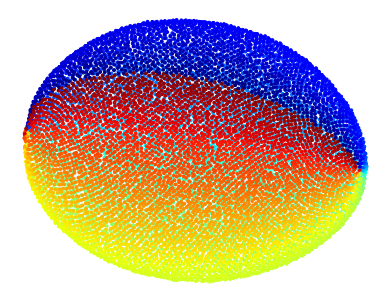

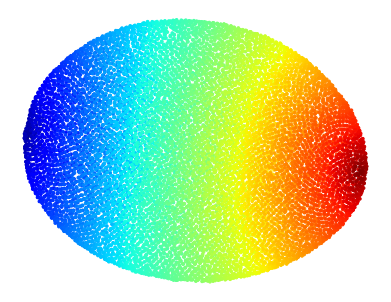

100 0.01


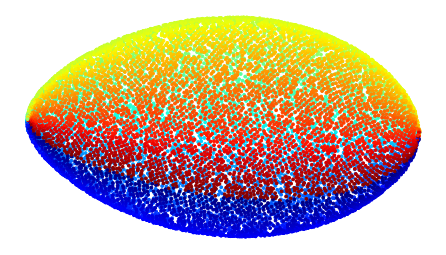

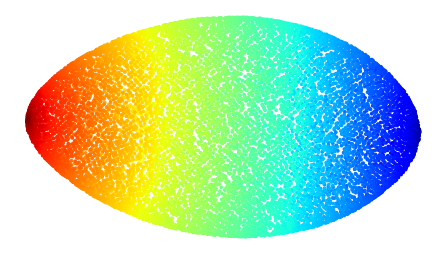

100 0.1


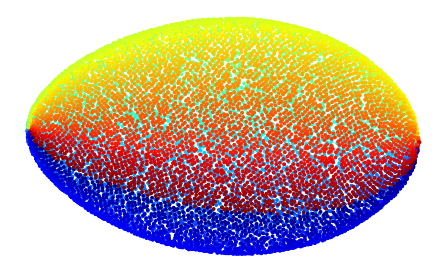

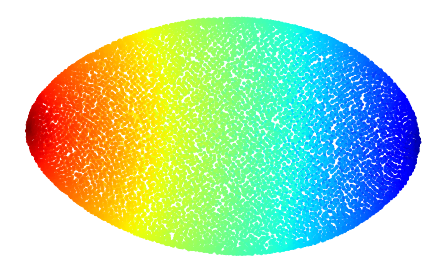

100 0.25


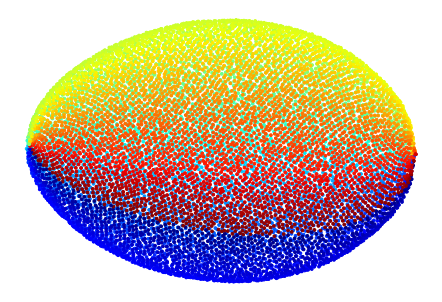

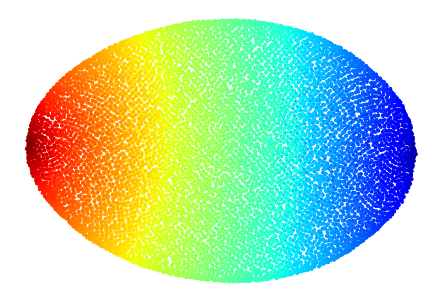

100 0.5


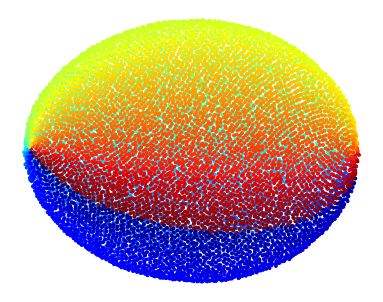

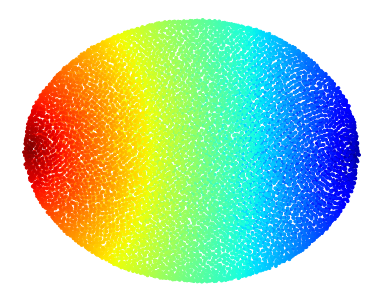

200 0.01


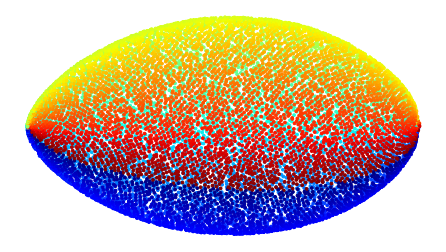

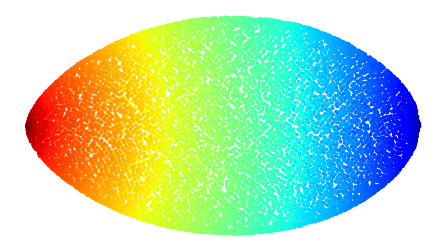

200 0.1


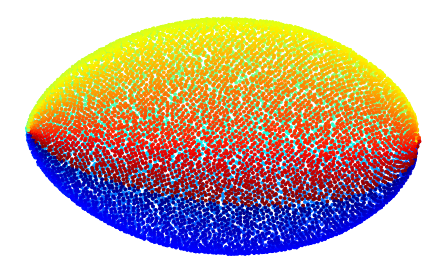

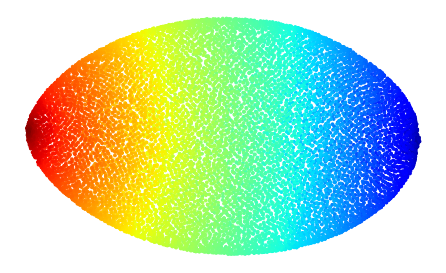

200 0.25


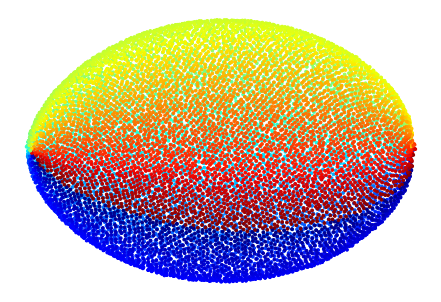

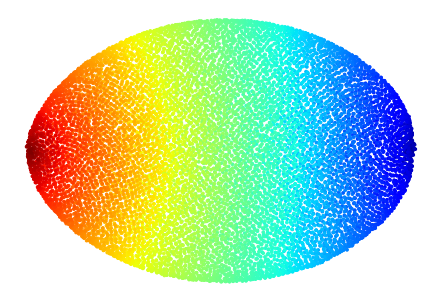

200 0.5


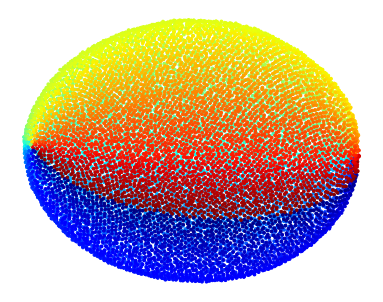

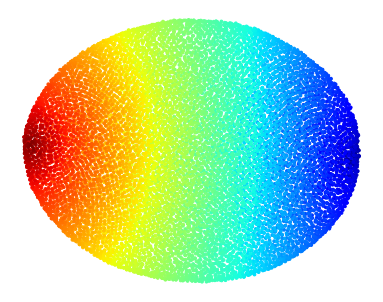

In [15]:
for n_neighbors in [25,50,100,200]:
    for min_dist in [0.01,0.1,0.25,0.5]:
        print(n_neighbors, min_dist)
        umap_obj = UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2,
                        random_state=42, n_epochs=500, metric='euclidean')
        y_umap = umap_obj.fit_transform(X)
        vis.global_embedding(y_umap, labelsMat[:,0], 'jet', title='UMAP0_'+str(n_neighbors)+'_'+str(min_dist))
        plt.show()
        vis.global_embedding(y_umap, labelsMat[:,1], 'jet', title='UMAP1_'+str(n_neighbors)+'_'+str(min_dist))
        plt.show()

# t-SNE

In [16]:
from sklearn.manifold import TSNE
import visualize
vis = visualize.Visualize(save_dir_root)

30 2


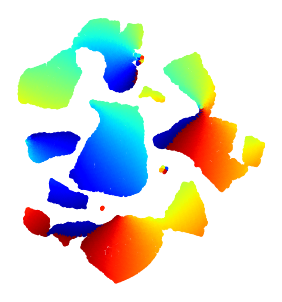

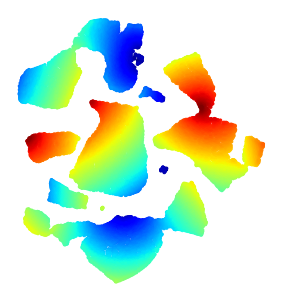

30 4


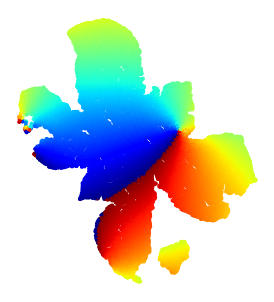

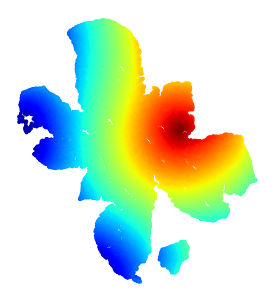

30 6


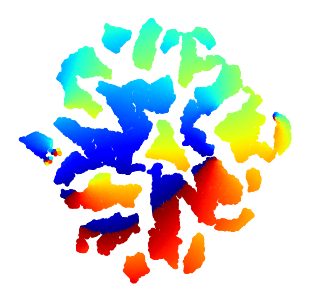

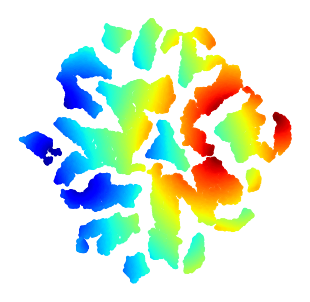

40 2


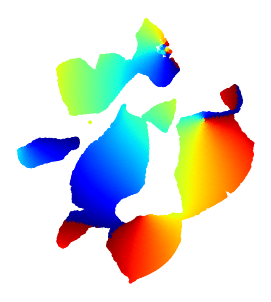

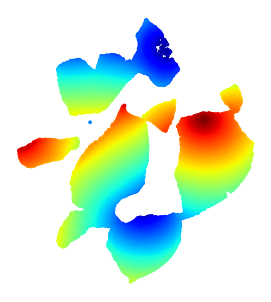

40 4


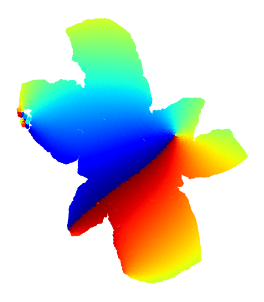

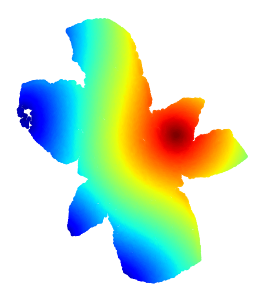

40 6


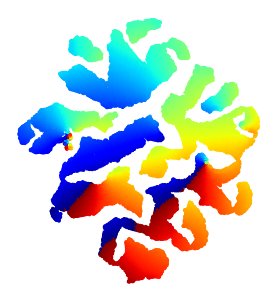

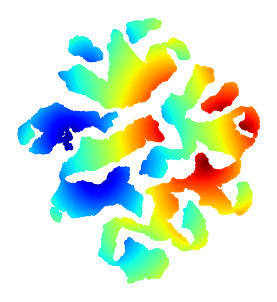

50 2


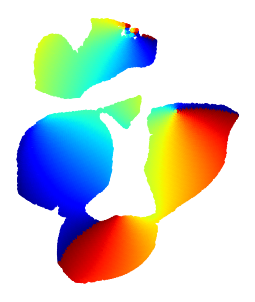

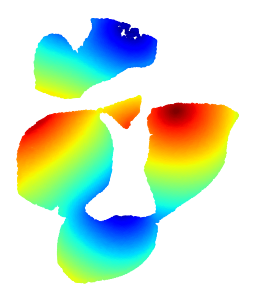

50 4


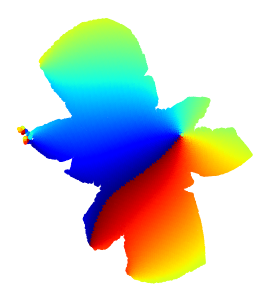

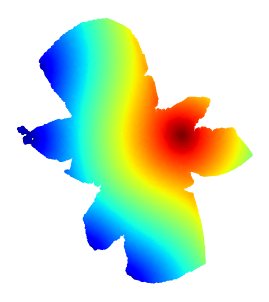

50 6


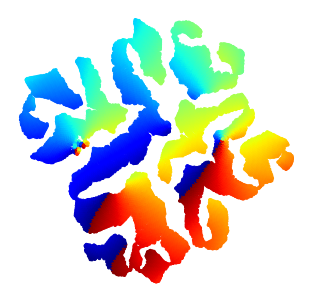

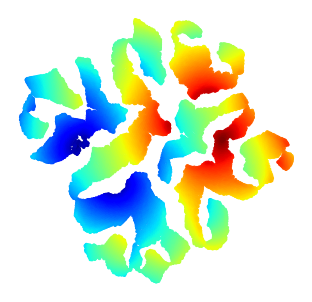

60 2


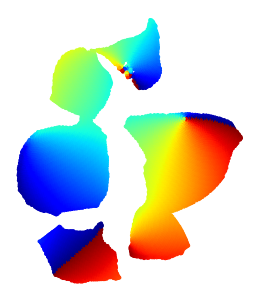

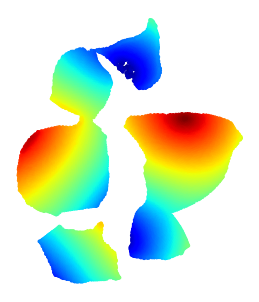

60 4


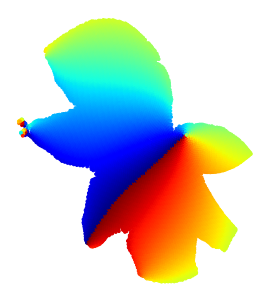

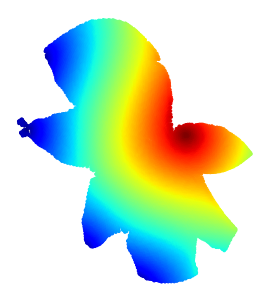

60 6


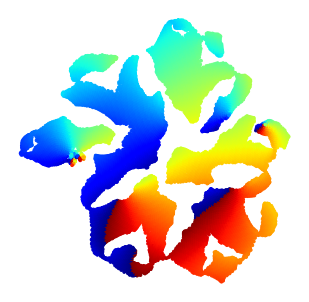

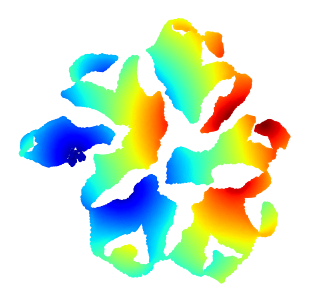

In [17]:
for perplexity in [30,40,50,60]:
    for ee in [2,4,6]:
        print(perplexity, ee)
        tsne_obj = TSNE(perplexity=perplexity, early_exaggeration=ee, n_components=2,
                        metric='euclidean', random_state=42, n_iter=1000,
                        n_jobs=-1, init='random')
        y_tsne = tsne_obj.fit_transform(X)
        vis.global_embedding(y_tsne, labelsMat[:,0], 'jet', title='t-SNE0_'+str(perplexity)+'_'+str(ee))
        plt.show()
        vis.global_embedding(y_tsne, labelsMat[:,1], 'jet', title='t-SNE1_'+str(perplexity)+'_'+str(ee))
        plt.show()